# Dog Breed Classification

This project builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and Itake a photo of adog , I want to know what breed of dog it is.

# 2. Data

The data were using is from kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features



**Some information about the data:**

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means * there are 120 different classes).
There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
# unzip the uploaded data into Google Drive

# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

## Get our workspace ready.

* Import TensorFlow 2.x
* Import TensorFlow Hub

In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version : ", tf.__version__)
print("TF Hub version : ", hub.__version__)

# Check for GPU availability
print("GPU", "available (Yesssssss!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version :  2.12.0
TF Hub version :  0.14.0
GPU available (Yesssssss!!!!!)


## Getting our data ready (turning into Tensors)

Let's start by accessing our data and checking out the labels.



In [3]:
# Checkout the labels of our data

import pandas as pd

labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")

print(labels_csv.describe())

print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [5]:
# How many images are there of each breed.

labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

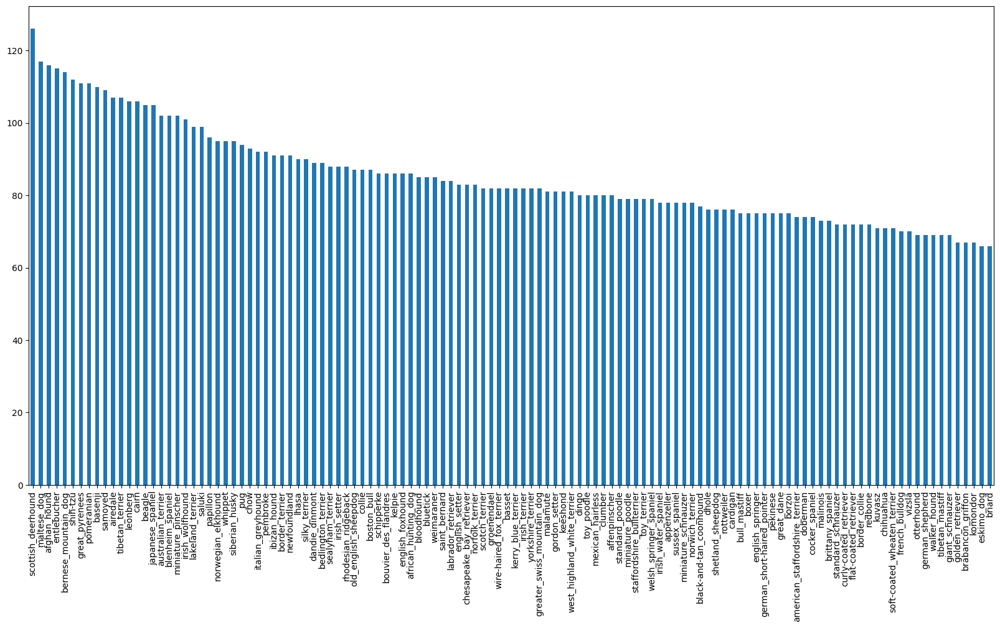

In [6]:
labels_csv["breed"].value_counts().plot.bar(figsize = (20, 10))

In [7]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [8]:
labels_csv["breed"].value_counts().median()

82.0

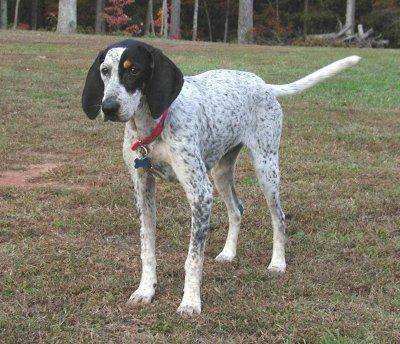

In [5]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

In [6]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [7]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames do no match actual amount of files, check the target directory.


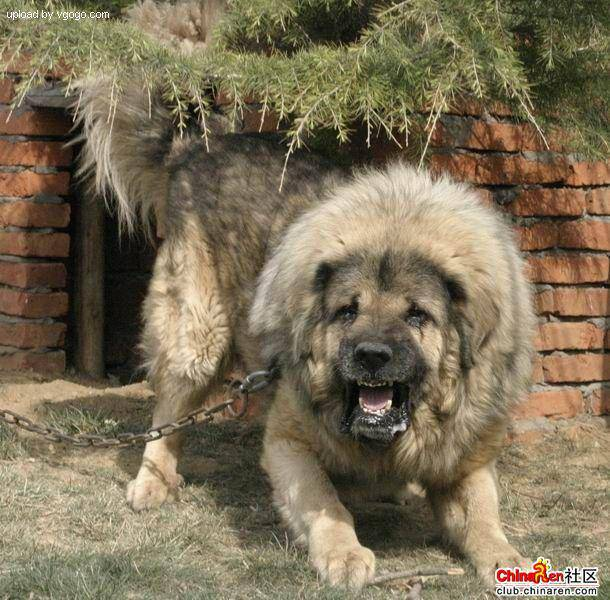

In [12]:
# One more check
Image(filenames[9000])

In [13]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [13]:
import numpy as np

# labels = labels_csv["breed"]
# labels = np.array(labels)

labels= labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels matches the number of filenames

if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels do not matches number of filenames, check data directories!")

Number of labels matches number of filenames!


In [16]:
# Find the unique label values

unique_breeds = np.unique(labels)

len(unique_breeds)

120

In [17]:
# Turn a single label into an array of booleans

print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every label into a boolean array

boolean_labels = [label == unique_breeds for label in labels]

boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Example : Turning boolean array into integers

print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[2]) # original label
print(np.where(unique_breeds == labels[2])) # index where label occurs
print(boolean_labels[2].argmax()) # index where label occurs in boolean array
print(boolean_labels[2].astype(int)) # there will be a 1 where the sample label occurs

pekinese
(array([85]),)
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

In [23]:
# Setup X & y variables

X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [24]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10222, step:1}

In [25]:
# Let's split our data into train and validation sets

from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val =  train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size = 0.2,
                                                   random_state = 42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [26]:
# Let's have a geez at the training data

X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Image (turning images into tensors)

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image


Before we do, let's see what importing an image looks like.

In [27]:
# Convert image to Numpy array
from matplotlib.pyplot import imread

image = imread(filenames[42])

image.shape

(257, 350, 3)

In [28]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [29]:
image.max(), image.min()

(255, 0)

In [30]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [31]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

Now we've seen what an image looks like as a Tensor,let's make a function to preprocess them.


1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image


In [32]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images

def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and size as input and turns image into a Tensor.
  """

  # Read an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg into numerical Tensor with 3 colour channels(Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [img_size, img_size])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go.. they all might not fit into memory.

So that's why we do about 32(this is batch size) images at a time(you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which looks like this:
`(image,  label)`.

In [33]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [34]:
# Demo of the above
(process_image(X[44]), tf.constant(y[44]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.33140624, 0.33924937, 0.25689644],
         [0.4096647 , 0.41358626, 0.342998  ],
         [0.43735576, 0.4409622 , 0.38123253],
         ...,
         [0.8859506 , 0.8859506 , 0.8859506 ],
         [0.8756915 , 0.86784834, 0.87961304],
         [0.847015  , 0.8391719 , 0.8509366 ]],
 
        [[0.3521279 , 0.35710865, 0.2833429 ],
         [0.40803257, 0.41195413, 0.34709066],
         [0.4532748 , 0.45688123, 0.40260953],
         ...,
         [0.8772584 , 0.8772584 , 0.8772584 ],
         [0.86699927, 0.85915613, 0.87092084],
         [0.8383228 , 0.8304797 , 0.8422444 ]],
 
        [[0.39051124, 0.3944328 , 0.32554272],
         [0.42637193, 0.4302935 , 0.36924654],
         [0.4804272 , 0.4832528 , 0.43067926],
         ...,
         [0.8704376 , 0.8704376 , 0.8704376 ],
         [0.859515  , 0.8516719 , 0.8634366 ],
         [0.8290179 , 0.82117474, 0.83293945]],
 
        ...,
 
        [[0.5583288 , 0.57127315

Now we've got a way to turn our data into tuples of Tensors in the form `(image, label)`, let's make a function to turn all of our data(x & y) into batches.

In [35]:
# Define batch size, 32 is a good start

BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):

  """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset, we don't need to shuffle it.
  elif valid_data:
    print("Creating Valid data batches...")
    data  = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and label into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling image filepaths
    data = data.shuffle(buffer_size = len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [36]:
# Creating and validation data batches

train_data = create_data_batches(X_train, y_train)

val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating Valid data batches...


In [37]:
# Check out the different attributes of our data batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [38]:
import matplotlib.pyplot as plt

# Creating a function for viewing in a data batch
def show_25_images(images, labels):
  """
    Displays a plot of 25 images and their labels from a data batch
  """

  # Setup the figure
  plt.figure(figsize = (10, 10))

  # Loop through 25 (for displaying images)
  for i in range(25):
    # Create subplots (5 row, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [39]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

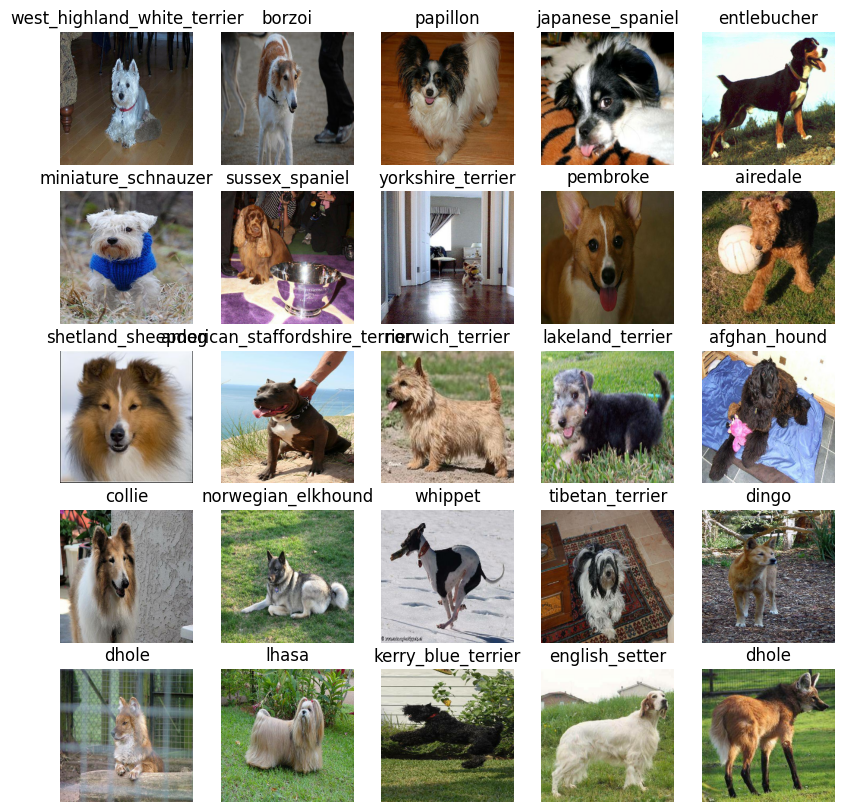

In [40]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
# len(train_images), len(train_labels)
show_25_images(train_images, train_labels)

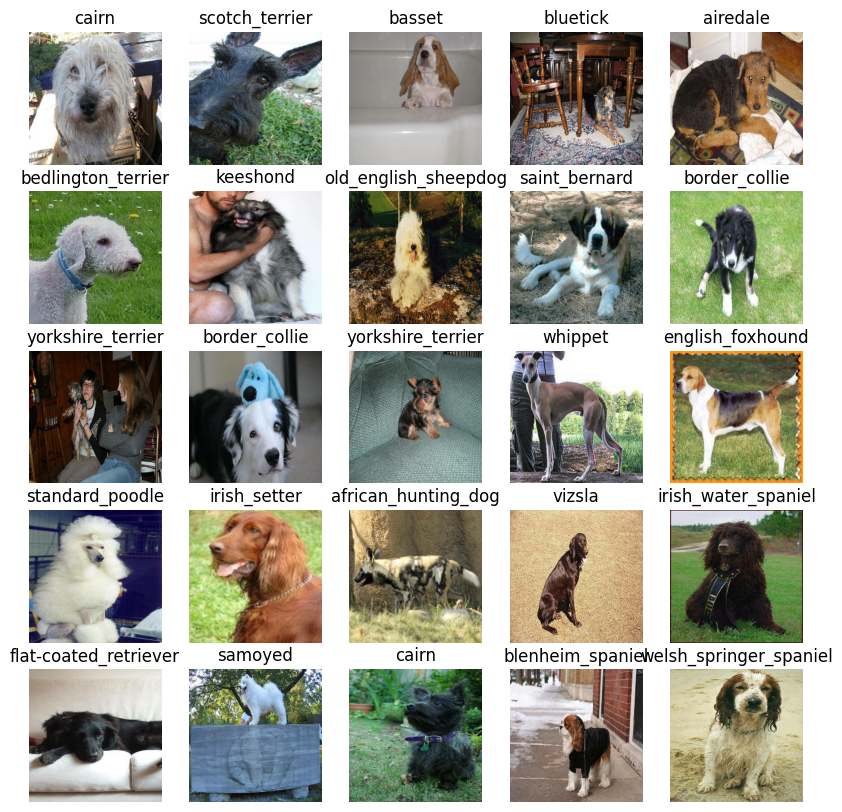

In [41]:
# Now let's visualize our validation sets
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [42]:
unique_breeds[y[0].argmax()]

'boston_bull'

## Building a model
Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [43]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go.
Let's put them together intooa keras deep learning model.

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [44]:
# Create a function which builds a Keras model.
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE,  model_url = MODEL_URL):
  print("Building model with : ", MODEL_URL)

  # Setup the model layers(Instantiate the model)
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax")    # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [45]:
model = create_model()
model.summary()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.


### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [46]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [47]:
import datetime

# Create a function to build a Tensorboard callback

def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment.
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [48]:
# Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [50]:
NUM_EPOCHS = 100 #@param {type : "slider", min : 10, max : 100, step : 10}

Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [49]:
# Build a function to train and return a trained model

def train_model():
  """
    Trains a given model and return a trained model.
  """
  # Create a model
  model = create_model()

  # Create new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model

In [52]:
# Fite the model to the data

model = train_model()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 231s 9s/step - loss: 4.6518 - accuracy: 0.0838 - val_loss: 3.5345 - val_accuracy: 0.2050
Epoch 2/100
25/25 [==============================] - 8s 302ms/step - loss: 1.6562 - accuracy: 0.6562 - val_loss: 2.1770 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 5s 209ms/step - loss: 0.5627 - accuracy: 0.9463 - val_loss: 1.6792 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 5s 204ms/step - loss: 0.2515 - accuracy: 0.9887 - val_loss: 1.4908 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1450 - accuracy: 0.9975 - val_loss: 1.4187 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 158ms/step - loss: 0.0989 - accuracy: 1.0000 - val_loss: 1.3738 - val_accuracy: 0.6300
Epoch 7/100
25/25 [=============================

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [53]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs


<IPython.core.display.Javascript object>

In [54]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Making and evaluating predictions using a trained model

In [50]:
# Make predictions on the validations data (not used to train on)

predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 26s 3s/step


array([[0.00049259, 0.00572233, 0.00091929, ..., 0.0001649 , 0.00118175,
        0.0010352 ],
       [0.00251151, 0.00230166, 0.00484916, ..., 0.00096813, 0.00124059,
        0.01280486],
       [0.00297219, 0.00038304, 0.0034156 , ..., 0.00243378, 0.00825089,
        0.00148658],
       ...,
       [0.01049727, 0.01505397, 0.00943824, ..., 0.00152179, 0.02076044,
        0.00024283],
       [0.00233085, 0.01685948, 0.00214917, ..., 0.00094039, 0.00114035,
        0.00191196],
       [0.01398825, 0.00130656, 0.00043035, ..., 0.00055542, 0.00108218,
        0.00068999]], dtype=float32)

In [51]:
predictions.shape

(200, 120)

In [52]:
len(y_val)

200

In [53]:
len(unique_breeds)

120

In [54]:
len(predictions[0])

120

In [55]:
np.sum(predictions[0])

0.99999994

In [56]:
np.sum(predictions[1])

1.0000001

In [57]:
# First predictions
index = 199
print(predictions[index])
print(f"Max value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max Index : {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")

[1.3988252e-02 1.3065572e-03 4.3034868e-04 6.5737840e-04 2.6879735e-02
 1.7502628e-03 3.8980271e-03 4.5584347e-03 4.2505946e-02 1.0890643e-02
 6.5294295e-03 7.1524573e-03 2.5263433e-03 1.3936238e-02 8.9666701e-04
 1.7794378e-03 2.6540542e-03 7.7445586e-03 1.4538688e-04 5.4974994e-04
 1.5790841e-03 1.7430896e-02 2.4648751e-03 2.3984032e-02 2.3846578e-02
 2.1067739e-04 6.5665310e-03 3.4199383e-03 5.4961145e-03 1.0433486e-03
 8.1308270e-03 3.1466372e-04 4.3988503e-03 8.1376155e-04 1.2561922e-03
 8.0376431e-02 8.3300611e-04 6.3075885e-02 2.1871516e-02 1.2299755e-01
 2.7101219e-04 9.1252371e-04 1.9464981e-03 1.8262228e-03 1.8541274e-03
 8.6478675e-03 2.5014169e-04 5.3392970e-03 3.0971138e-02 8.0355667e-03
 8.2882969e-03 4.7340568e-02 6.0723345e-03 5.2799531e-03 2.8008032e-03
 1.3733850e-03 4.8321686e-03 1.7362386e-02 1.0889031e-02 3.2564751e-03
 1.8686365e-03 5.1927537e-04 1.7623691e-02 5.4293103e-04 8.2441820e-03
 7.3710866e-03 2.1480671e-03 4.8769772e-04 1.5453721e-03 2.3003814e-03
 2.233

In [58]:
unique_breeds[16]

'border_collie'

In [59]:
# Turn predictions probabilities into their respective label (easier to understand)
def get_pred_label(predictions_probabilities):
  """
  Turns an array of predictions probabilities into a label.
  """
  return unique_breeds[np.argmax(predictions_probabilities)]


# Get a predicted label based on an array of predictions probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'border_collie'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [60]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [61]:
# Create a functions to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [62]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images


Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [63]:
def plot_pred(predictions_probabilities, labels, images, n = 1):

  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = predictions_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label),
                                    color = color)



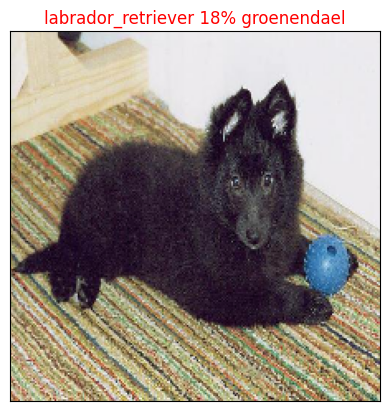

In [64]:
plot_pred(predictions_probabilities = predictions, labels = val_labels, images = val_images, n = 77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [65]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

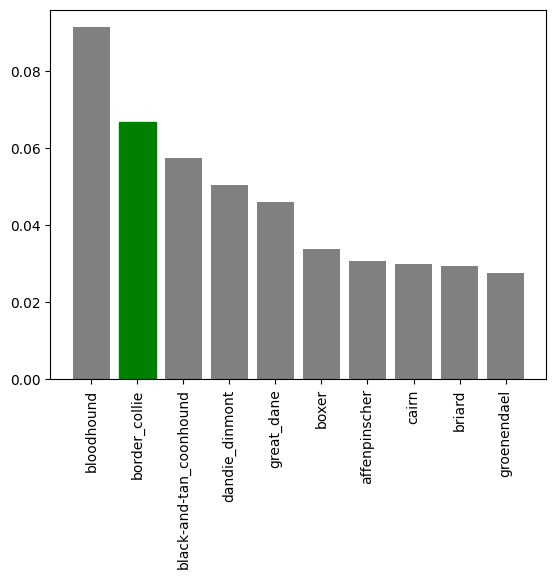

In [66]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

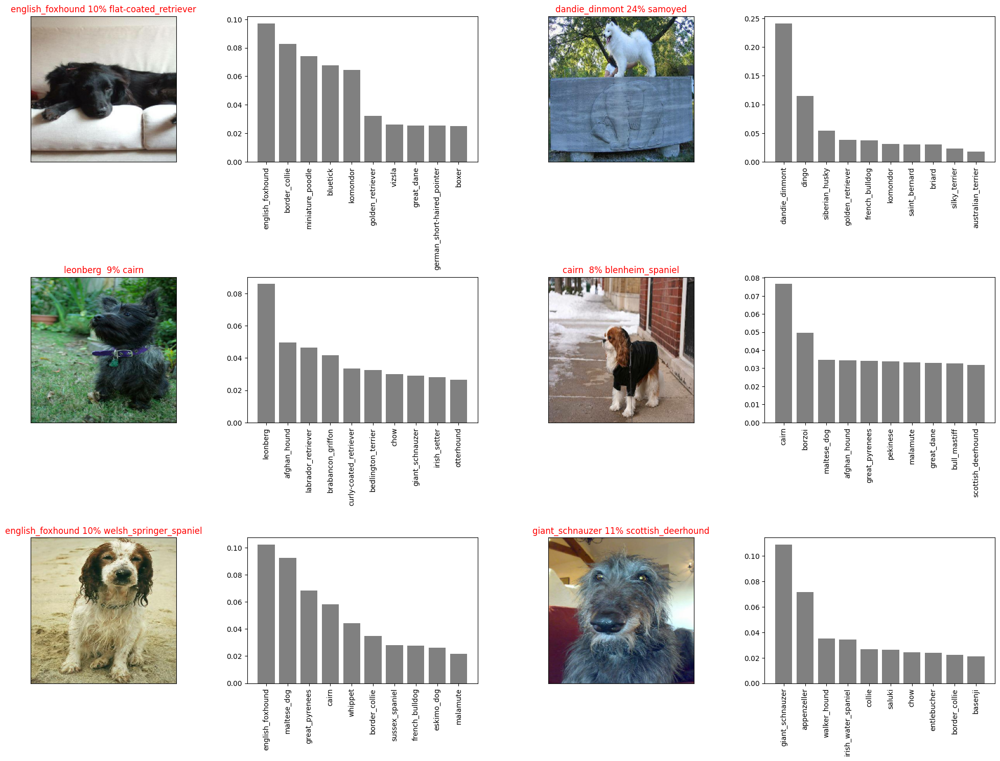

In [67]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(predictions_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i + i_multiplier)

  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i + i_multiplier)
plt.tight_layout(h_pad= 1.0)
plt.show()

## Saving and reloading a trained model

In [68]:
# Create a funciton to save a model

def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """

  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y %m %d - %H %M %s"))

  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [69]:
# Create a function to load a trained model:-
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """

  print(f"Loading saved model from : {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer" : hub.KerasLayer})

  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [70]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/2023 08 26 - 10 03 1693044186-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/2023 08 26 - 10 03 1693044186-1000-images-mobilenetv2-Adam.h5'

In [71]:
# Load a trained model
loaded_1000_image_model= load_model("drive/MyDrive/Dog Vision/models/2023 08 25 - 10 58 1692961138-1000-images-mobilenetv2-Adam.h5")

Loading saved model from : drive/MyDrive/Dog Vision/models/2023 08 25 - 10 58 1692961138-1000-images-mobilenetv2-Adam.h5


In [72]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 85ms/step - loss: 5.7103 - accuracy: 0.0050


[5.710305690765381, 0.004999999888241291]

In [73]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 95ms/step - loss: 1.3030 - accuracy: 0.6400


[1.3030275106430054, 0.6399999856948853]

## Training a big dog model (on the full data)

In [74]:
len(X), len(y)

(10222, 10222)

In [75]:
len(X_train), len(y_train)

(800, 800)

In [76]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [82]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [77]:
# Create a model for full model
full_model = create_model()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [78]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note** Running the cell below will take while(maybe up to 30 minutes for the first epochs) because the GPU we're using in the runtime has to laod all of the images into memory.

In [85]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 45s 122ms/step - loss: 1.3560 - accuracy: 0.6666
Epoch 2/100
320/320 [==============================] - 43s 135ms/step - loss: 0.4003 - accuracy: 0.8845
Epoch 3/100
320/320 [==============================] - 40s 126ms/step - loss: 0.2355 - accuracy: 0.9358
Epoch 4/100
320/320 [==============================] - 41s 129ms/step - loss: 0.1540 - accuracy: 0.9643
Epoch 5/100
320/320 [==============================] - 39s 121ms/step - loss: 0.1064 - accuracy: 0.9793
Epoch 6/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0784 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0593 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0473 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0371 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 39s 123m

In [86]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/2023 08 25 - 15 26 1692977163-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/2023 08 25 - 15 26 1692977163-full-image-set-mobilenetv2-Adam.h5'

In [79]:
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/2023 08 25 - 11 41 1692963682-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from : drive/MyDrive/Dog Vision/models/2023 08 25 - 11 41 1692963682-full-image-set-mobilenetv2-Adam.h5


# Now making predictions on test test data set.

Since our model has been trained on images in the form of Tensor batches, to make prediction on the test data, we'll have to get it into the same format.

Earlier we created `create_data_batches()` which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
 * Get the test image filenames.
 * Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data`  parameter to `True` (since the test data doesn't have labels).
 * Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [88]:
# Load test image filenames

test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/de291f05facd9c7db8d4880a0c84263b.jpg',
 'drive/MyDrive/Dog Vision/test/deb66780609abfef7f5048df02149839.jpg',
 'drive/MyDrive/Dog Vision/test/e12731c30619c3fa4b0d9d9a76fb9d60.jpg',
 'drive/MyDrive/Dog Vision/test/e2f853c8345758faf5d9b2075f196fd3.jpg',
 'drive/MyDrive/Dog Vision/test/e39be68f3200f0ecde589e571ae6df06.jpg',
 'drive/MyDrive/Dog Vision/test/deaef21699dae3945a79dcb820b2a980.jpg',
 'drive/MyDrive/Dog Vision/test/dd7867245d5c104fffb5afe027e41cd1.jpg',
 'drive/MyDrive/Dog Vision/test/e381c5fcf1420985b20117e4bc7d38cd.jpg',
 'drive/MyDrive/Dog Vision/test/e0e3eb01e80b1d694a47b23909e158ec.jpg',
 'drive/MyDrive/Dog Vision/test/e6af47e8b6973c8f8d2b9fd5af94c54d.jpg']

In [89]:
len(test_filenames)

10357

In [90]:
# Create test data batch

test_data = create_data_batches(test_filenames, test_data = True)


Creating test data batches...


In [91]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note :** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr).

In [92]:
# Make predictions on test data batch using the loaded full model.
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 3976s 12s/step


In [93]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter = ",")

In [94]:
# Load predictions (Numpy array) from csv file.
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter = ",")

In [95]:
test_predictions[:10]

array([[4.50281826e-12, 3.84858811e-11, 8.83633028e-11, ...,
        1.68718980e-05, 4.13423737e-14, 2.03317785e-09],
       [1.97555483e-09, 7.91427169e-07, 1.66644221e-09, ...,
        3.32213356e-04, 3.06006359e-06, 1.91059719e-08],
       [1.17041325e-11, 1.66099301e-09, 6.63665954e-12, ...,
        7.89192323e-12, 3.20409121e-09, 2.15146674e-08],
       ...,
       [1.20263039e-13, 3.51913991e-06, 7.13991323e-12, ...,
        3.47960736e-06, 4.11072421e-09, 2.72960343e-09],
       [2.29100364e-10, 1.47912124e-06, 1.55649910e-10, ...,
        4.68723051e-08, 1.76468926e-11, 7.95811819e-11],
       [2.13243673e-10, 1.23927181e-13, 2.36999192e-14, ...,
        6.19427673e-14, 1.15501819e-13, 1.56357804e-12]])

In [96]:
test_predictions.shape

(10357, 120)

### Preparing test dataset prediction for Kaggle

Looking at the Kaggle sample submission. at https://www.kaggle.com/competitions/dog-breed-identification/overview


To get the data in required format, we'll:
  * Create a pandas DataFrame with an ID column as well as a column for each dog breed.
  * Add data to the ID column by extracting the test image ID's from their filepaths.
  * Add data ( the prediction probabilities ) to each of the dog breed columns.
  * Export the DataFrame as a CSV to submit it to Kaggle.

In [97]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [100]:
# Append test image ID's to predictions DataFrame.
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [101]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de291f05facd9c7db8d4880a0c84263b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,deb66780609abfef7f5048df02149839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e12731c30619c3fa4b0d9d9a76fb9d60,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e2f853c8345758faf5d9b2075f196fd3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e39be68f3200f0ecde589e571ae6df06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [102]:
# Add the prediction probabilities to each dog bredd column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de291f05facd9c7db8d4880a0c84263b,4.502818e-12,3.848588e-11,8.836330e-11,2.471654e-13,1.955286e-11,3.409076e-10,3.965232e-10,4.146072e-04,1.297835e-02,...,4.136843e-07,1.456858e-12,5.354815e-07,1.804839e-08,9.852802e-01,1.386469e-10,4.357772e-14,1.687190e-05,4.134237e-14,2.033178e-09
1,deb66780609abfef7f5048df02149839,1.975555e-09,7.914272e-07,1.666442e-09,2.324021e-11,1.213043e-07,1.803804e-12,4.139440e-10,2.047343e-10,2.190311e-11,...,4.592228e-03,1.724876e-08,3.702119e-08,4.376421e-08,1.130622e-06,7.203890e-04,5.187182e-06,3.322134e-04,3.060064e-06,1.910597e-08
2,e12731c30619c3fa4b0d9d9a76fb9d60,1.170413e-11,1.660993e-09,6.636660e-12,1.802164e-14,6.511425e-08,2.497178e-12,4.851486e-08,9.712148e-14,3.806598e-10,...,6.904088e-12,9.442952e-11,9.500609e-09,2.501830e-09,1.132799e-08,3.307416e-12,3.058691e-08,7.891923e-12,3.204091e-09,2.151467e-08
3,e2f853c8345758faf5d9b2075f196fd3,6.094524e-11,2.765312e-11,5.110768e-12,8.039964e-13,2.104854e-11,1.939325e-09,4.691841e-14,5.141093e-13,1.377509e-05,...,1.048003e-09,5.283920e-10,1.798782e-06,1.179589e-10,8.845769e-12,4.579530e-13,9.398378e-13,3.260745e-11,6.300915e-15,8.577802e-12
4,e39be68f3200f0ecde589e571ae6df06,2.971496e-07,6.665841e-11,7.620595e-10,4.120165e-13,8.970994e-12,1.406962e-08,1.066371e-10,3.586077e-10,3.874416e-12,...,1.397091e-07,4.128607e-07,6.026314e-11,3.359591e-11,8.924749e-11,1.911494e-11,7.079350e-08,6.430582e-12,3.608966e-07,1.012355e-04


In [103]:
# Save our predictions dataframe to CSV for submission to kaggle.
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_mobilenetV2.csv",
                index = False)

## Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [87]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/My-Dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [88]:
custom_image_paths

['drive/MyDrive/Dog Vision/My-Dog-photos/dog-3.jpg',
 'drive/MyDrive/Dog Vision/My-Dog-photos/dog-1.jpg',
 'drive/MyDrive/Dog Vision/My-Dog-photos/dog-2.jpg']

In [89]:
# Turn custom images into batches datasets.
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [90]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
# custom_preds

1/1 [==============================] - 0s 58ms/step


In [91]:
custom_preds.shape

(3, 120)

In [92]:
# Get custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['maltese_dog', 'beagle', 'boxer']

In [93]:
# Get custom images (our unbatchify() function won't work since there aren't labels...)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

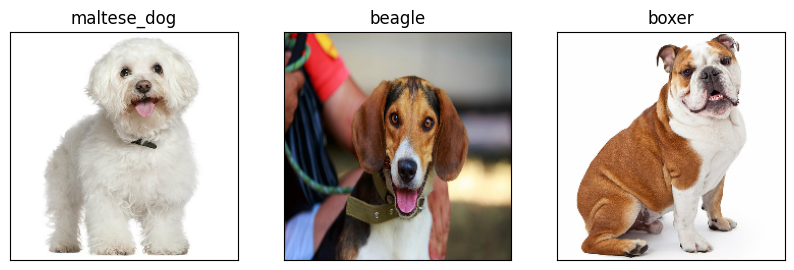

In [95]:
# Check custom image prediction
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)